### Laboratorium 6 - część badawcza

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:

1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:

```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.


In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").


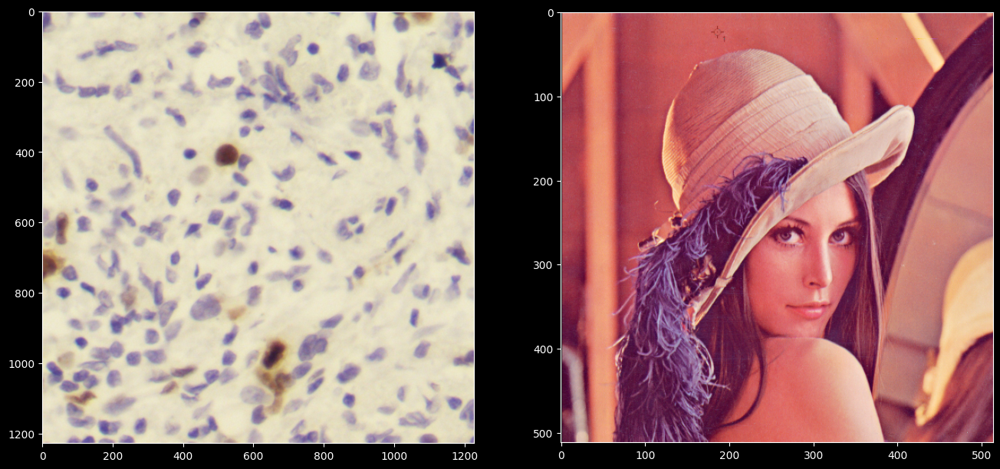

In [5]:
cells = cv2.imread('data/dane6/p1_0308_7.jpg')
lena = cv2.imread('data/dane6/Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

    contrastThreshold  edgeThreshold  keypoints_cells  keypoints_lena
0                0.04              5              588             672
1                0.04             10              705            1112
2                0.04             15              732            1298
3                0.04             20              743            1398
4                0.06              5              358             463
5                0.06             10              405             775
6                0.06             15              416             915
7                0.06             20              421             997
8                0.08              5              206             291
9                0.08             10              224             477
10               0.08             15              227             567
11               0.08             20              229             629
12               0.10              5              141             155
13               0.1

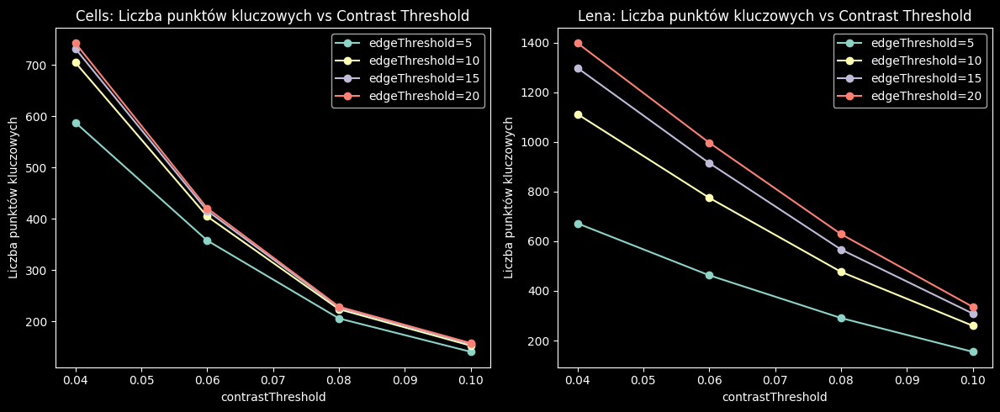

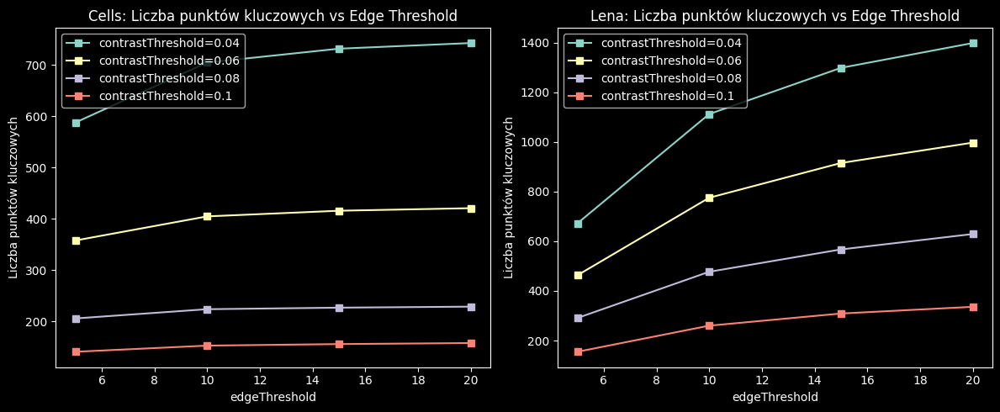

In [6]:
contrast_thresholds = [0.04, 0.06, 0.08, 0.10]
edge_thresholds = [5, 10, 15, 20]

# Przygotowanie tabeli wyników
results = []

for ct in contrast_thresholds:
    for et in edge_thresholds:
        # Tworzenie instancji SIFT z określonymi parametrami
        sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
        
        # Detekcja punktów kluczowych w obrazie cells
        keypoints_cells = sift.detect(cells, None)
        num_keypoints_cells = len(keypoints_cells)
        
        # Detekcja punktów kluczowych w obrazie lena
        keypoints_lena = sift.detect(lena, None)
        num_keypoints_lena = len(keypoints_lena)
        
        # Zapisanie wyników
        results.append({
            'contrastThreshold': ct,
            'edgeThreshold': et,
            'keypoints_cells': num_keypoints_cells,
            'keypoints_lena': num_keypoints_lena
        })

# Konwersja wyników do DataFrame
df_results = pd.DataFrame(results)

# Wyświetlenie wyników
print(df_results)

# Wizualizacja wpływu contrastThreshold na liczbę punktów kluczowych
plt.figure(figsize=(12, 5))

# Dla obrazu cells
plt.subplot(1, 2, 1)
for et in edge_thresholds:
    subset = df_results[df_results['edgeThreshold'] == et]
    plt.plot(subset['contrastThreshold'], subset['keypoints_cells'], marker='o', label=f'edgeThreshold={et}')
plt.title('Cells: Liczba punktów kluczowych vs Contrast Threshold')
plt.xlabel('contrastThreshold')
plt.ylabel('Liczba punktów kluczowych')
plt.legend()

# Dla obrazu lena
plt.subplot(1, 2, 2)
for et in edge_thresholds:
    subset = df_results[df_results['edgeThreshold'] == et]
    plt.plot(subset['contrastThreshold'], subset['keypoints_lena'], marker='o', label=f'edgeThreshold={et}')
plt.title('Lena: Liczba punktów kluczowych vs Contrast Threshold')
plt.xlabel('contrastThreshold')
plt.ylabel('Liczba punktów kluczowych')
plt.legend()

plt.tight_layout()
plt.show()

# Wizualizacja wpływu edgeThreshold na liczbę punktów kluczowych
plt.figure(figsize=(12, 5))

# Dla obrazu cells
plt.subplot(1, 2, 1)
for ct in contrast_thresholds:
    subset = df_results[df_results['contrastThreshold'] == ct]
    plt.plot(subset['edgeThreshold'], subset['keypoints_cells'], marker='s', label=f'contrastThreshold={ct}')
plt.title('Cells: Liczba punktów kluczowych vs Edge Threshold')
plt.xlabel('edgeThreshold')
plt.ylabel('Liczba punktów kluczowych')
plt.legend()

# Dla obrazu lena
plt.subplot(1, 2, 2)
for ct in contrast_thresholds:
    subset = df_results[df_results['contrastThreshold'] == ct]
    plt.plot(subset['edgeThreshold'], subset['keypoints_lena'], marker='s', label=f'contrastThreshold={ct}')
plt.title('Lena: Liczba punktów kluczowych vs Edge Threshold')
plt.xlabel('edgeThreshold')
plt.ylabel('Liczba punktów kluczowych')
plt.legend()

plt.tight_layout()
plt.show()

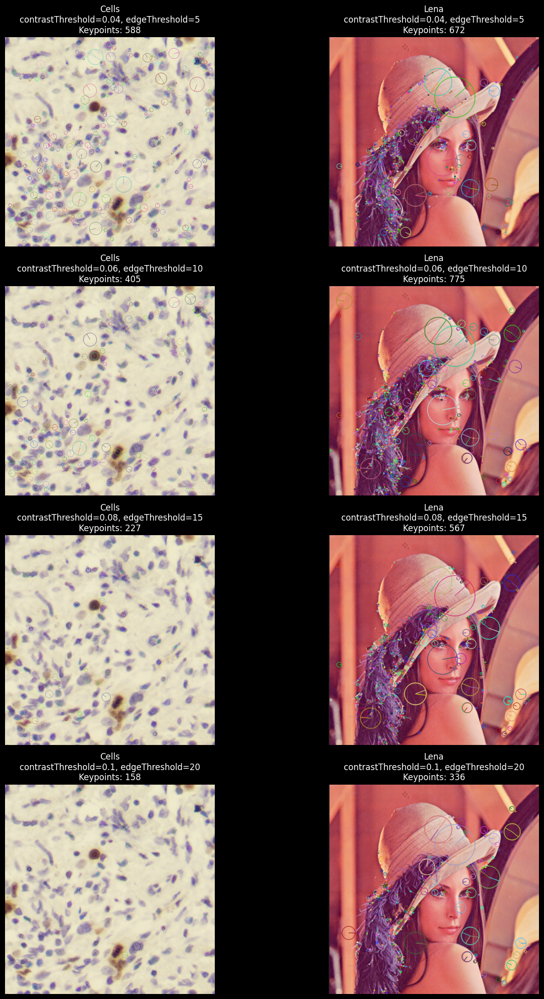

In [10]:

# Wybierzemy kilka przykładowych kombinacji parametrów do wizualizacji
example_params = [
    {'contrastThreshold': 0.04, 'edgeThreshold': 5},
    {'contrastThreshold': 0.06, 'edgeThreshold': 10},
    {'contrastThreshold': 0.08, 'edgeThreshold': 15},
    {'contrastThreshold': 0.10, 'edgeThreshold': 20},
]

# Funkcja do rysowania punktów kluczowych
def draw_keypoints(image, keypoints, title):
    # Konwertujemy obraz do kolorowego (BGR) jeśli jest w skali szarości
    if len(image.shape) == 2:
        image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    else:
        image_color = image.copy()
    
    # Rysowanie punktów kluczowych
    image_with_keypoints = cv2.drawKeypoints(
        image_color, keypoints, None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    
    # Wyświetlanie obrazu
    plt.imshow(cv2.cvtColor(image_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')

# Tworzenie wykresów z narysowanymi punktami kluczowymi
num_examples = len(example_params)
fig, axes = plt.subplots(num_examples, 2, figsize=(15, 5 * num_examples))

for idx, params in enumerate(example_params):
    ct = params['contrastThreshold']
    et = params['edgeThreshold']
    
    # Tworzenie instancji SIFT z wybranymi parametrami
    sift = cv2.SIFT_create(contrastThreshold=ct, edgeThreshold=et)
    
    # Detekcja punktów kluczowych
    keypoints_cells = sift.detect(cells, None)
    keypoints_lena = sift.detect(lena, None)
    
    # Rysowanie punktów kluczowych na obrazach
    plt.subplot(num_examples, 2, idx * 2 + 1)
    draw_keypoints(cells, keypoints_cells, f'Cells\ncontrastThreshold={ct}, edgeThreshold={et}\nKeypoints: {len(keypoints_cells)}')
    
    plt.subplot(num_examples, 2, idx * 2 + 2)
    draw_keypoints(lena, keypoints_lena, f'Lena\ncontrastThreshold={ct}, edgeThreshold={et}\nKeypoints: {len(keypoints_lena)}')

plt.tight_layout()
plt.show()

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, sprawdzając stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`. Dokonaj oceny wizualnie, sprawdzając zachowanie detektora dla kilku wybranych rotacji i skal (**nie** grid search).

_Co świadczy o stabilności i niezmienniczości detektora?_


In [7]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

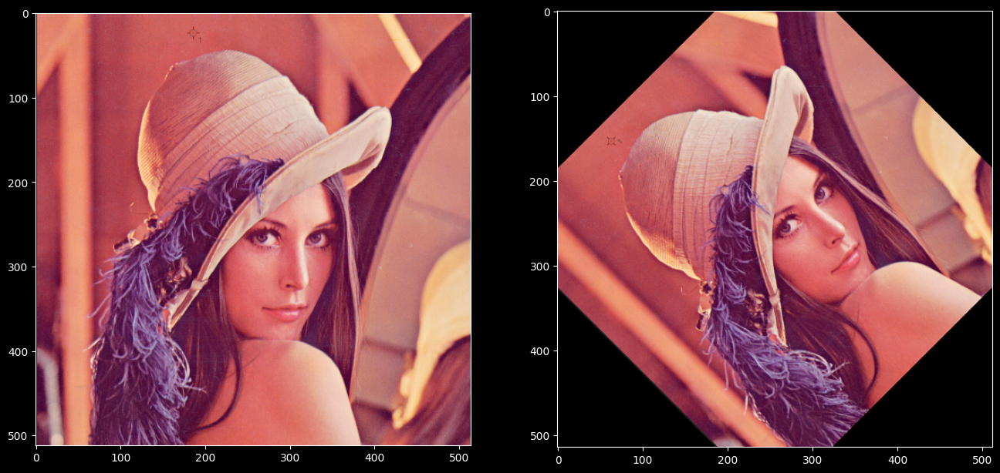

In [8]:
# przykład dla Leny, pamiętaj o cells!
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

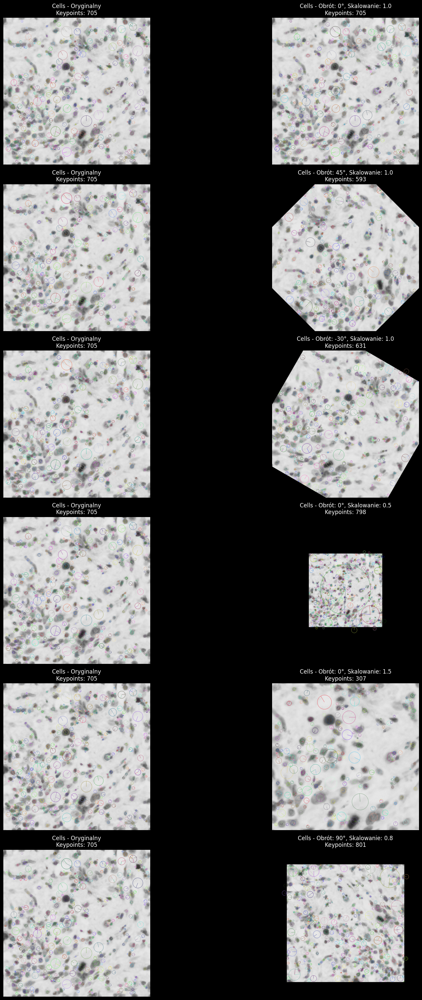

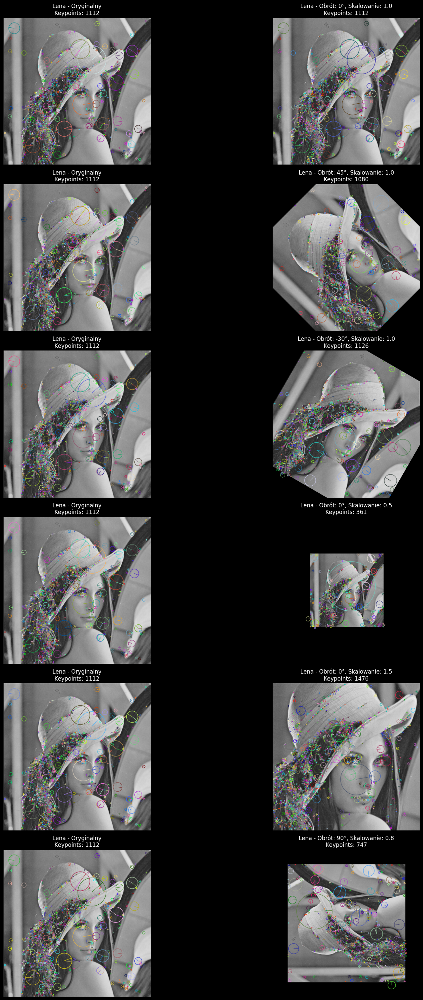

In [13]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Funkcja do obrotu i skalowania obrazu
def transform_image(image, angle=None, scale=None):
    transformed = image.copy()
    rows, cols = transformed.shape[:2]
    center = (cols / 2, rows / 2)
    
    if angle is not None or scale is not None:
        if angle is None:
            angle = 0
        if scale is None:
            scale = 1.0
        M = cv2.getRotationMatrix2D(center, angle, scale)
        transformed = cv2.warpAffine(transformed, M, (cols, rows), flags=cv2.INTER_CUBIC)
    return transformed

# Funkcja do rysowania punktów kluczowych
def draw_keypoints(image, keypoints, title):
    # Konwertujemy obraz do kolorowego (BGR) jeśli jest w skali szarości
    if len(image.shape) == 2:
        image_color = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
    else:
        image_color = image.copy()
    
    # Rysowanie punktów kluczowych
    image_with_keypoints = cv2.drawKeypoints(
        image_color, keypoints, None,
        flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    
    # Wyświetlanie obrazu
    plt.imshow(cv2.cvtColor(image_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')

# Inicjalizacja SIFT
sift = cv2.SIFT_create()

# Wczytanie obrazów w skali szarości
cells = cv2.imread('data/dane6/p1_0308_7.jpg', cv2.IMREAD_GRAYSCALE)
lena = cv2.imread('data/dane6/Lena.jpg', cv2.IMREAD_GRAYSCALE)

# Sprawdzenie, czy obrazy zostały poprawnie wczytane
if cells is None or lena is None:
    raise IOError("Nie można wczytać jednego z obrazów. Sprawdź ścieżki do plików.")

# Definicja przekształceń do przetestowania
transformations = [
    {'angle': 0, 'scale': 1.0},    # Oryginalny
    {'angle': 45, 'scale': 1.0},   # Obrót o 45 stopni
    {'angle': -30, 'scale': 1.0},  # Obrót o -30 stopni
    {'angle': 0, 'scale': 0.5},    # Skalowanie do 50%
    {'angle': 0, 'scale': 1.5},    # Skalowanie do 150%
    {'angle': 90, 'scale': 0.8},   # Obrót o 90 stopni i skalowanie do 80%
]

# Lista obrazów do przetestowania
images = {
    'Cells': cells,
    'Lena': lena
}

# Iteracja przez obrazy i ich przekształcenia
for img_name, img in images.items():
    plt.figure(figsize=(20, 30))
    num_transforms = len(transformations)
    
    for idx, params in enumerate(transformations):
        angle = params['angle']
        scale = params['scale']
        
        # Przekształcenie obrazu
        transformed_img = transform_image(img, angle=angle, scale=scale)
        
        # Detekcja punktów kluczowych
        keypoints_original = sift.detect(img, None)
        keypoints_transformed = sift.detect(transformed_img, None)
        
        # Tworzenie subplotów
        plt.subplot(num_transforms, 2, idx * 2 + 1)
        draw_keypoints(img, keypoints_original, f'{img_name} - Oryginalny\nKeypoints: {len(keypoints_original)}')
        
        plt.subplot(num_transforms, 2, idx * 2 + 2)
        draw_keypoints(transformed_img, keypoints_transformed, f'{img_name} - Obrót: {angle}°, Skalowanie: {scale}\nKeypoints: {len(keypoints_transformed)}')
    
    plt.tight_layout()
    plt.show()


#### Zadanie 3

Dane są obrazy `coke` i `table`. Wykorzystaj metodologię parowania punktów kluczowych do znalezienia wystąpienia puszki z Colą na stole. To zadanie jest podzielone na dwie części - czytaj dalej.


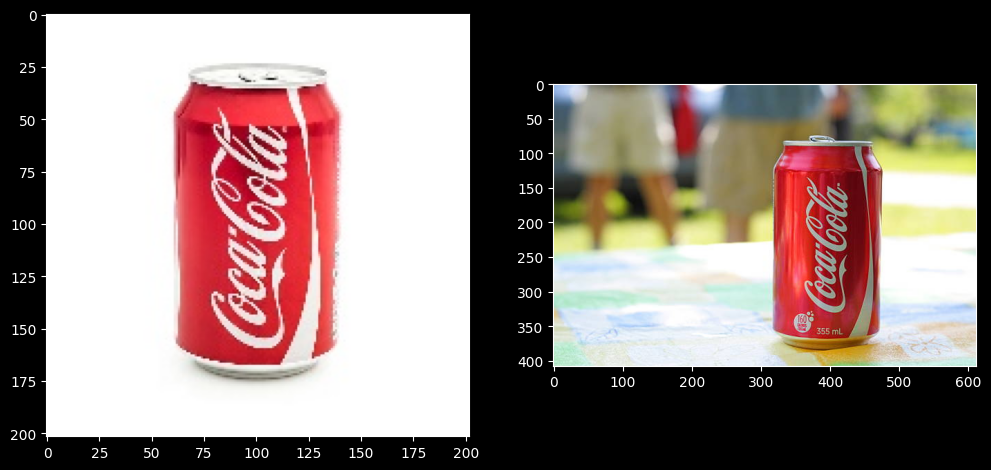

In [9]:
coke = cv2.imread('data/dane6/coke.jpg')
table = cv2.imread('data/dane6/coke-table.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(12,12))
a1.imshow(coke[..., ::-1]);
a2.imshow(table[..., ::-1]);

##### Zadanie 3a

Wykonaj detekcję punktów kluczowych i ich parowanie z użyciem dowolnego matchera. Wykonaj filtrację znalezionych par po dystansie - co obserwujesz, zmieniając próg?


##### Zadanie 3b

Znajdź transformację geometryczną dla par dopasowanych punktów, tak aby przekształcić `coke` (_train_) do geometrii `table` (_query_). Zademonstruj poprawność, zestawiając obok siebie przekształconą wersję `coke` oraz oryginalny `table`, bądź nanosząc jedno na drugie. Zidentyfikuj punkty, które znaleziona transformacja przekształca "dobrze", tzn. ich współrzędne po przekształceniu leżą w pobliżu odpowiadających im punktów z drugiego obrazu; nanieś je na obraz.

_Jak na wyniki wpływa wykrycie większej lub mniejszej liczby punktów kluczowych na etapie SIFT? W jakim stopniu filtracja poprawia rezultaty? Jak działa i jaką rolę w procesie parowania odgrywa RANSAC?_
